# Parameter estimation with Markov chain Monte Carlo

[Data set download](https://s3.amazonaws.com/bebi103.caltech.edu/data/singer_transcript_counts.csv)

<hr>

In [1]:
# Colab setup ------------------
import os, sys, subprocess
if "google.colab" in sys.modules:
    cmd = "pip install --upgrade iqplot colorcet bebi103 arviz cmdstanpy watermark"
    process = subprocess.Popen(cmd.split(), stdout=subprocess.PIPE, stderr=subprocess.PIPE)
    stdout, stderr = process.communicate()
    import cmdstanpy; cmdstanpy.install_cmdstan()
    data_path = "https://s3.amazonaws.com/bebi103.caltech.edu/data/"
else:
    data_path = "../data/"
# ------------------------------

/Users/bois/opt/anaconda3/lib/python3.9/site-packages/colorcet/__init__.py:74: UserWarning: Trying to register the cmap 'cet_gray' which already exists.
  register_cmap("cet_"+name, cmap=cm[name])
/Users/bois/opt/anaconda3/lib/python3.9/site-packages/colorcet/__init__.py:74: UserWarning: Trying to register the cmap 'cet_gray_r' which already exists.
  register_cmap("cet_"+name, cmap=cm[name])


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
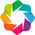

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
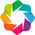

Loading BokehJS ...

In [2]:
import numpy as np
import scipy.stats as st
import pandas as pd

import cmdstanpy
import arviz as az

import iqplot
import bebi103

import holoviews as hv
hv.extension('bokeh')
bebi103.hv.set_defaults()

import bokeh.io
import bokeh.plotting
bokeh.io.output_notebook()

<hr>

In this lesson, we will learn how to use **Markov chain Monte Carlo** to do parameter estimation. To get the basic idea behind MCMC, imagine for a moment that we can draw samples out of the posterior distribution. This means that the probability of choosing given values of a set of parameters is proportional to the posterior probability of that set of values. If we drew many many such samples, we could reconstruct the posterior from the samples, e.g., by making histograms. That's a big thing to imagine: that we can draw properly weighted samples. But, it turns out that we can! That is what MCMC allows us to do.

We discussed some theory behind this seemingly miraculous capability in lecture. For this lesson, we will just use the fact that we can do the sampling to learn about posterior distributions in the context of parameter estimation.

## Stan: Our MCMC engine

We will use [Stan](http://mc-stan.org) as our main engine for performing MCMC, and will use one of its Python interfaces, [CmdStanPy](https://mc-stan.org/cmdstanpy/). Stan is the state of the art for MCMC. Importantly, it is also a probabilistic programming language, which allows us to more easily specify Bayesian generative models. The [Stan documentation](https://mc-stan.org/users/documentation/) will be very useful for you.

## The data set

The data come from the [Elowitz lab](http://elowitz.caltech.edu/), published in Singer et al., Dynamic Heterogeneity and DNA Methylation in Embryonic Stem Cells, *Molec. Cell*, **55**, 319-331, 2014, available [here](https://doi.org/10.1016/j.molcel.2014.06.029). In the following paragraphs, I repeat the description of the data set and EDA from last term:

>In this paper, the authors investigated cell populations of embryonic stem cells using RNA single molecule fluorescence in situ hybridization (smFISH), a technique that enables them to count the number of mRNA transcripts in a cell for a given gene.  They were able to measure four different genes in the same cells. So, for one experiment, they get the counts of four different genes in a collection of cells.  
>
>The authors focused on genes that code for pluripotency-associated regulators to study cell differentiation. Indeed, differing gene expression levels are a hallmark of differentiated cells.  The authors do not just look at counts in a given cell at a given time.  The *temporal* nature of gene expression is also important.  While the authors do not directly look at temporal data using smFISH (since the technique requires fixing the cells), they did look at time lapse fluorescence movies of other regulators.  We will not focus on these experiments here, but will discuss how the distribution of mRNA counts acquired via smFISH can serve to provide some insight about the dynamics of gene expression.
>
>The data set we are analyzing now comes from an experiment where smFISH was performed in 279 cells for the genes *rex1*, *rest*, *nanog*, and *prdm14*.  The data set may be downloaded at [https://s3.amazonaws.com/bebi103.caltech.edu/data/singer_transcript_counts.csv](https://s3.amazonaws.com/bebi103.caltech.edu/data/singer_transcript_counts.csv).

## ECDFs of mRNA counts

We will do a quick EDA to get a feel for the data set by generating ECDFs for the mRNA counts for each of the four genes. 

In [3]:
# Load DataFrame
df = pd.read_csv(os.path.join(data_path, 'singer_transcript_counts.csv'), comment='#')

genes = ["Nanog", "Prdm14", "Rest", "Rex1"]

plots = [
    iqplot.ecdf(
        data=df[gene].values,
        q=gene,
        x_axis_label="mRNA count",
        title=gene,
        frame_height=150,
        frame_width=200,
    )
    for gene in genes
]

bokeh.io.show(bokeh.layouts.gridplot(plots, ncols=2))

Note the difference in the $x$-axis scales. Clearly, *prdm14* has far fewer mRNA copies than the other genes. The presence of two inflection points in the Rex1 EDCF implies bimodality.

## Building a generative model

As we discussed in a [lesson last term](https://bebi103a.github.io/lessons/18/numerical_mle.html#Model-for-mRNA-levels), we can model the transcript counts, which result from bursty gene expression, as being Negative Binomially distributed. For a given gene, the likelihood for the counts is

\begin{align}
n_i \mid \alpha, b \sim \text{NegBinom}(\alpha, 1/b) \;\forall i,
\end{align}

where $\alpha$ is the **burst frequency** (higher $\alpha$ means gene expression comes on more frequently) and $b$ is the **burst size**, i.e., the typical number of transcripts made per burst. We have therefore identified the two parameters we need to estimate, $\alpha$ and $b$.

Because the Negative Binomial distribution is often parametrized in terms of $\alpha$ and $\beta= 1/b$, we can alternatively state our likelihood as

\begin{align}
&\beta = 1/b,\\[1em]
&n_i \mid \alpha, \beta \sim \text{NegBinom}(\alpha, \beta)\;\; \forall i.
\end{align}

Given that we have a Negative Binomial likelihood, we are left to specify priors the burst size $b$ and the burst frequency $\alpha$.

### Priors for burst size and inter-burst time

We will apply the [bet-the-farm technique](../05/choice_of_prior.rst#The-bet-the-farm-method-of-specifying-weakly-informative-priors) to get our priors for the burst size and inter-burst times. I would expect the time between bursts to be longer than a second, since it takes time for the transcriptional machinery to assemble. I would expect it to be shorter than a few hours, since an organism would need to adapt its gene expression based on environmental changes on that time scale or faster. The time between bursts needs to be in units of RNA lifetimes, and bacterial RNA lifetimes are of order minutes. So, the range of values of $\alpha$ is $10^{-2}$ to $10^2$, leading to a prior of

\begin{align}
\log_{10} \alpha \sim \text{Norm}(0, 1).
\end{align}

I would expect the burst size to depend on promoter strength and/or strength of transcriptional activators. I could imagine anywhere from a few to a few thousand transcripts per burst, giving a range of $10^0$ to $10^4$, and a prior of

\begin{align}
\log_{10} b \sim \text{Norm}(2, 1).
\end{align}

We then have the following model.

\begin{align}
&\log_{10} \alpha \sim \text{Norm}(0, 1),\\[1em]
&\log_{10} b \sim \text{Norm}(2, 1),\\[1em]
&\beta = 1/b,\\[1em]
&n_i \sim \text{NegBinom}(\alpha, \beta) \;\forall i.
\end{align}

## Sampling the posterior

To draw samples out of the posterior, we need to use some new Stan syntax. Here is the Stan code we will use with some notes about Stan syntax.

```stan
data {
  int<lower=0> N;
  int<lower=0> n[N];
}


parameters {
  real log10_alpha;
  real log10_b;
}


transformed parameters {
  real alpha = 10^log10_alpha;
  real b = 10^log10_b;
  real beta_ = 1.0 / b;
}


model {
  // Priors
  log10_alpha ~ normal(0, 1);
  log10_b ~ normal(2, 1);

  // Likelihood
  n ~ neg_binomial(alpha, beta_);
}
```

- Note that the raise-to-power operator is `^`, not `**` as in Python.
- The `data` block contains the counts $n$ of the mRNA transcripts. There are $N$ cells that are measured. Most `data` blocks look like this. There is an integer parameter that specifies the size of the data set, and then the data set is given as an array. Note that we specified a lower bound on the data (as we will do on the parameters) using the `<lower=0>` syntax.
- The `parameters` block tell us what the parameters of the posterior are. In this case, we wish to sample out of the posterior $g(\alpha, b \mid \mathbf{n})$, where $\mathbf{n}$ is the set of transcript counts for the gene. So, the two parameters are $\alpha$ and $b$. However, since defining the prior was more easily done in terms of logarithms, we specify $\log_{10} \alpha$ and $\log_{10} b$ as the parameters.
- The `transformed parameters` block allows you to do any transformation of the parameters you are sampling for convenience. In this case, Stan's Negative Binomial distribution is parametrized by $\beta = 1/b$, so we make the transformation of the `b` to `beta_`. Notice that I have called this variable `beta_` and not `beta`. I did this because `beta` is one of Stan's distributions, and you should avoid naming a variable after a word that is already in the Stan language. The other transformations we need to make involve converting the logarithms to the actual parameter values.
- Finally, the `model` block is where the model is specified. The syntax of the model block is almost identical to that of the hand-written model. 

Now that we have specified our model, we can compile it.

In [4]:
sm = cmdstanpy.CmdStanModel(stan_file='smfish.stan')

INFO:cmdstanpy:compiling stan file /Users/bois/Dropbox/git/bebi103_course/2022/b/content/lessons/09/smfish.stan to exe file /Users/bois/Dropbox/git/bebi103_course/2022/b/content/lessons/09/smfish
INFO:cmdstanpy:compiled model executable: /Users/bois/Dropbox/git/bebi103_course/2022/b/content/lessons/09/smfish


With our compiled model, we just need to specify the data and let Stan's sampler do the work! When using CmdStanPy, the data has to be passed in as a dictionary with keys corresponding to the variable names declared in the `data` block of the Stan program and values as Numpy arrays with the appropriate data type. For this calculation, we will use the data set for the *rest* gene.

In [5]:
# Construct data dict, making sure data are ints
data = dict(N=len(df), n=df["Rest"].values.astype(int))

# Sample using Stan
samples = sm.sample(    
    data=data,
    chains=4,
    iter_sampling=1000,
)

# Convert to ArviZ InferenceData instance
samples = az.from_cmdstanpy(posterior=samples)

INFO:cmdstanpy:CmdStan start procesing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

INFO:cmdstanpy:CmdStan done processing.


Let's take a quick look at the samples.

In [6]:
samples.posterior

<xarray.Dataset>
Dimensions:      (chain: 4, draw: 1000)
Coordinates:
  * chain        (chain) int64 0 1 2 3
  * draw         (draw) int64 0 1 2 3 4 5 6 7 ... 993 994 995 996 997 998 999
Data variables:
    log10_alpha  (chain, draw) float64 0.6656 0.6617 0.6493 ... 0.649 0.6351
    log10_b      (chain, draw) float64 1.196 1.201 1.199 ... 1.215 1.214 1.252
    alpha        (chain, draw) float64 4.631 4.589 4.459 ... 4.478 4.457 4.316
    b            (chain, draw) float64 15.71 15.88 15.81 ... 16.39 16.38 17.88
    beta_        (chain, draw) float64 0.06367 0.06299 ... 0.06107 0.05593
Attributes:
    created_at:                 2021-12-24T02:56:19.890593
    arviz_version:              0.11.4
    inference_library:          cmdstanpy
    inference_library_version:  1.0.0

As we have already seen, the samples are indexed by chain and draw. Parameters represented in the `parameters` and `transformed parameters` blocks are reported.

## Plots of the samples

There are many ways of looking at the samples. In this case, since we have two parameters of interest, the pulse frequency and pulse size, we can plot the samples as a scatter plot to get the approximate density. For this kind of plot, HoloViews expects a Pandas data frame (or similar object). We can convert an xarray object into a data frame using the `to_dataframe()` method.

In [7]:
df_mcmc = samples.posterior.to_dataframe()

# Take a look
df_mcmc.head()

log10_alpha  log10_b    alpha        b     beta_
chain draw                                                  
0     0        0.665629  1.19609  4.63051  15.7068  0.063667
      1        0.661750  1.20076  4.58934  15.8767  0.062985
      2        0.649257  1.19902  4.45920  15.8134  0.063238
      3        0.649507  1.19761  4.46177  15.7618  0.063445
      4        0.663214  1.23235  4.60483  17.0747  0.058566

The indexes from the xarray become indexes for the data frame and the parameter names are the columns. We can now use HoloViews to make our scatter plot. I will use transparency to help visualize the density of points.

In [8]:
hv.Points(
    data=df_mcmc,
    kdims=[('alpha', 'α'), 'b']
).opts(
    alpha=0.2,
    size=2,
)

:Points   [alpha,b]   (log10_alpha,log10_b,beta_)

We see very strong correlation between $\alpha$ and $b$. This does not necessarily mean that they depend on each other. Rather, it means that our degree of belief about their values depends on both in a correlated way. The measurements we made cannot effectively separate the effects of $\alpha$ and $b$ on the transcript counts.

## Marginalizing the posterior

We can also plot the marginalized posterior distributions. Remember that the marginalized distributions properly take into account the effects of the other variable, including the strong correlation I just mentioned. To obtain the marginalized distribution, we simply ignore the samples of the parameters we are marginalizing out. It is convenient to look at the marginalized distributions as ECDFs.

In [9]:
plots = [
    iqplot.ecdf(df_mcmc, q=param, plot_height=200, plot_width=250)
    for param in ["alpha", "b"]
]

bokeh.io.show(bokeh.layouts.gridplot(plots, ncols=2))

Alternatively, we can visualize the marginalized posterior PDFs as histograms. Because we have such a large number of samples, binning bias from histograms is less of a concern.

In [10]:
plots = [
    iqplot.histogram(df_mcmc, q=param, plot_height=200, plot_width=250, rug=False)
    for param in ["alpha", "b"]
]

bokeh.io.show(bokeh.layouts.gridplot(plots, ncols=2))

## Analysis for all genes

We can do the same analysis for all genes. To do so, we input the data sets for each gene into the sampler and make our plot of the posterior. When we do the sampling, to avoid clutter on our screen, we can disable the logging that CmdStanPy sends by using the `bebi103.stan.disable_logging()` context manager, and we will use the `show_progress=False` kwarg when calling `sm.sample()`.

In [11]:
plots = []

for gene in df.columns:
    data = dict(N=len(df), n=df[gene].values.astype(int))

    with bebi103.stan.disable_logging():
        samples = sm.sample(
            data=data, chains=4, iter_sampling=1000, show_progress=False
        )

    samples = az.from_cmdstanpy(posterior=samples)
    df_mcmc = samples.posterior.to_dataframe()

    plots.append(
        hv.Points(data=df_mcmc, kdims=[("alpha", "α"), "b"], label=gene).opts(
            alpha=0.05, axiswise=True, frame_height=200, frame_width=200, size=2
        )
    )

hv.Layout(plots).cols(2)

:Layout
   .Points.Rex1   :Points   [alpha,b]   (log10_alpha,log10_b,beta_)
   .Points.Rest   :Points   [alpha,b]   (log10_alpha,log10_b,beta_)
   .Points.Nanog  :Points   [alpha,b]   (log10_alpha,log10_b,beta_)
   .Points.Prdm14 :Points   [alpha,b]   (log10_alpha,log10_b,beta_)

Note that this single Negative Binomial model probably does not describe the Rex1 data, as can be seen from the ECDF of the measurements. Nonetheless, we can still assume the model is true and compute (i.e., sample) the posterior *as if the model were true*. This is always what we are doing when we perform parameter estimations. That said, we should seek a more apt model for Rex1.

## Display of "best fit"

After performing an MCMC calculation to access the posterior, we often want to visualize, for example, the ECDF of the measurements along with ECDFs predicted from the model. We will discuss methods for doing this in coming lessons when we discuss **posterior predictive checks**. For now, we will plot theoretical CDFs for parameter sets drawn from the posterior. First, we'll grab the posterior samples again.

In [12]:
# Re-obtain samples for rest
data = dict(N=len(df), n=df["Rest"].values.astype(int))

with bebi103.stan.disable_logging():
    samples = sm.sample(    
        data=data,
        chains=4,
        iter_sampling=1000,
        show_progress=False,
    )

samples = az.from_cmdstanpy(posterior=samples)

And now we'll get a plot of the ECDF.

In [13]:
p = iqplot.ecdf(data=df['Rest'].values, x_axis_label='mRNA count')

We'll generate a new CDFs for 100 sets of parameter values.

In [14]:
# x-values and samples to use in plot
x = np.arange(251)
alphas = samples.posterior["alpha"].values.flatten()[::40]
betas = samples.posterior["beta_"].values.flatten()[::40]

for alpha, beta in zip(alphas, betas):
    y = st.nbinom.cdf(x, alpha, beta / (1 + beta))
    x_plot, y_plot = bebi103.viz.cdf_to_staircase(x, y)
    p.line(x_plot, y_plot, line_width=0.5, color="orange", level="underlay")

bokeh.io.show(p)

The measured CDF seems to be within reason given the model. This is not true for the Rex1 gene, however.

In [15]:
# Re-obtain samples for rest
data = dict(N=len(df), n=df["Rex1"].values.astype(int))

with bebi103.stan.disable_logging():
    samples = sm.sample(
        data=data,
        chains=4,
        iter_sampling=1000,
        show_progress=False,
    )

samples = az.from_cmdstanpy(posterior=samples)

# Make ECDF
p = iqplot.ecdf(data=df["Rex1"].values, x_axis_label="mRNA count")

# x-values and samples to use in plot
x = np.arange(426)
alphas = samples.posterior["alpha"].values.flatten()[::40]
betas = samples.posterior["beta_"].values.flatten()[::40]

for alpha, beta in zip(alphas, betas):
    y = st.nbinom.cdf(x, alpha, beta / (1 + beta))
    x_plot, y_plot = bebi103.viz.cdf_to_staircase(x, y)
    p.line(x_plot, y_plot, line_width=0.5, color="orange", level="underlay")

bokeh.io.show(p)

The lesson here is that getting nicely identifiable parameter estimates does not mean that the model is good. As I mentioned before, we will do more careful assessment of this when we do posterior predictive checks.

In [16]:
bebi103.stan.clean_cmdstan()

## Computing environment

In [17]:
%load_ext watermark
%watermark -v -p numpy,scipy,pandas,cmdstanpy,arviz,bokeh,holoviews,iqplot,bebi103,jupyterlab
print("cmdstan   :", bebi103.stan.cmdstan_version())

Python implementation: CPython
Python version       : 3.9.7
IPython version      : 7.29.0

numpy     : 1.20.3
scipy     : 1.7.1
pandas    : 1.3.4
cmdstanpy : 1.0.0
arviz     : 0.11.4
bokeh     : 2.3.3
holoviews : 1.14.6
iqplot    : 0.2.4
bebi103   : 0.1.10
jupyterlab: 3.2.1

cmdstan   : 2.28.2
